# Data exploration

The purpose of this notebook is to explore the audio files in the dataset, and find out if there is any properties of the audio that makes it possible to robustly distinguish between normal machine sounds and anomalous sounds.

In [6]:
# public modules
import random
import common as com
import librosa
import IPython.display as ipd
import os
import glob
import sys
import path
import numpy
import seaborn as sns
from sklearn import metrics
from dlcliche.utils import *
from dlcliche.notebook import *
from dlcliche.utils import (
    sys, random, Path, np, plt, EasyDict,
    ensure_folder, deterministic_everything,
)


Machine types: ['slider']


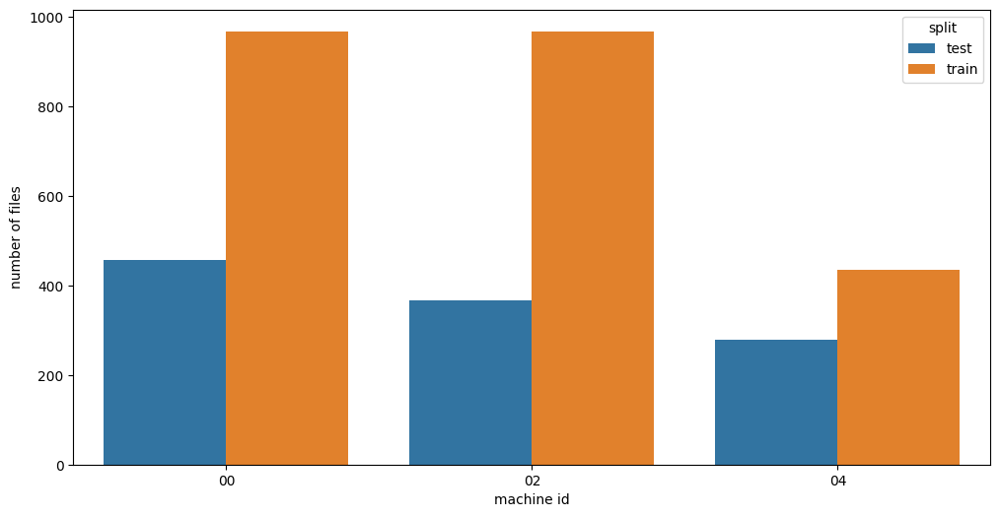

id      00         02         04      
split test train test train test train
file   456   968  367   968  278   434
type   456   968  367   968  278   434

In [7]:
# Visualizing the distribution between train and test data
DATA_ROOT=Path("../input/dev_data/dev_data/")
types = [t.name for t in sorted(DATA_ROOT.glob('*')) if t.is_dir()]
print('Machine types:', types)

df = pd.DataFrame()
df['file'] = sorted(DATA_ROOT.glob('*/*/*.wav'))
df['type'] = df.file.map(lambda f: f.parent.parent.name)
df['split'] = df.file.map(lambda f: f.parent.name)
df['id'] = df.file.map(lambda s: str(s).split('/')[-1].split('_')[-2])

agg = df.groupby(['id', 'split']).agg('count')
fig = plt.figure(figsize=(12.0, 6.0))
g = sns.barplot(x="id", y="file", hue="split", data=agg.reset_index())
plt.xlabel("machine id")
plt.ylabel("number of files")
plt.show()
agg.transpose()

## Listen to the sound and look at waveform

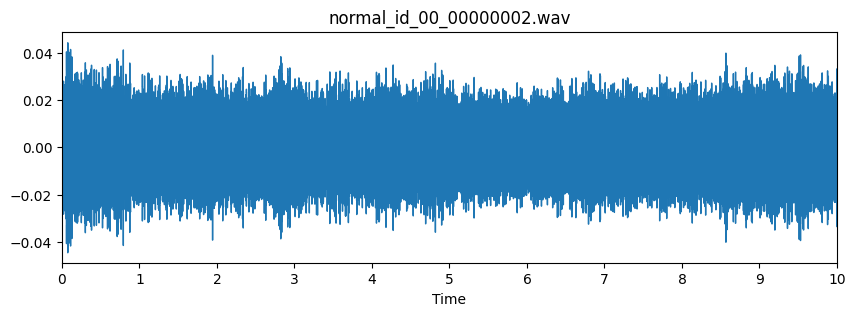

In [3]:
#Listen to a normal sound
dsr=8000
file_path = '../input/dev_data/dev_data/slider/train/normal_id_00_00000002.wav'
normal, sr = librosa.load(file_path, sr=dsr)
fig, ax = plt.subplots(figsize=(10, 3))
librosa.display.waveshow(normal,sr=dsr)
ax.set(title=file_path[-25:])
ax.set_xlim([0, len(normal)/dsr])
IPython.display.Audio(data=normal, rate=dsr)


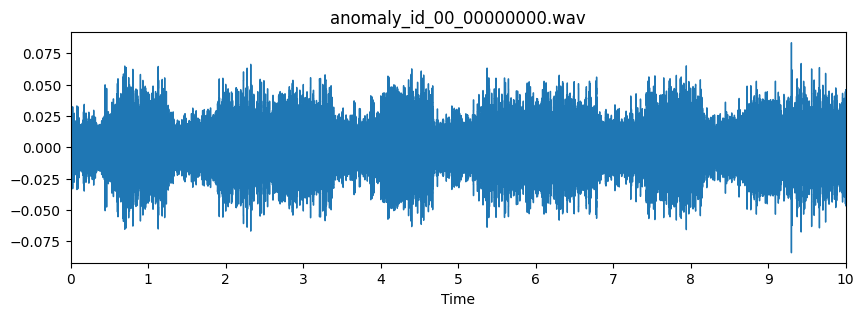

In [5]:
#Listen to an anomalous sound
file_path = '../input/dev_data/dev_data/slider/test/anomaly_id_00_00000000.wav'
anomaly, sr = librosa.load(file_path, sr=dsr)
fig, ax = plt.subplots(figsize=(10, 3))
librosa.display.waveshow(anomaly,sr=dsr)
ax.set(title=file_path[-26:])
ax.set_xlim([0, len(anomaly)/dsr])
IPython.display.Audio(data=anomaly, rate=dsr)

We can clearly hear that there is a distinct fault with the machine in the anomalous sound. When looking at waveforms, we can also see that there is distinct differences between the two.

## Narrowband and wideband spectrograms

/tmp/ipykernel_876/3690662502.py:6: FutureWarning:

waveshow() keyword argument 'x_axis' has been renamed to 'axis' in version 0.10.0.
	This alias will be removed in version 1.0.



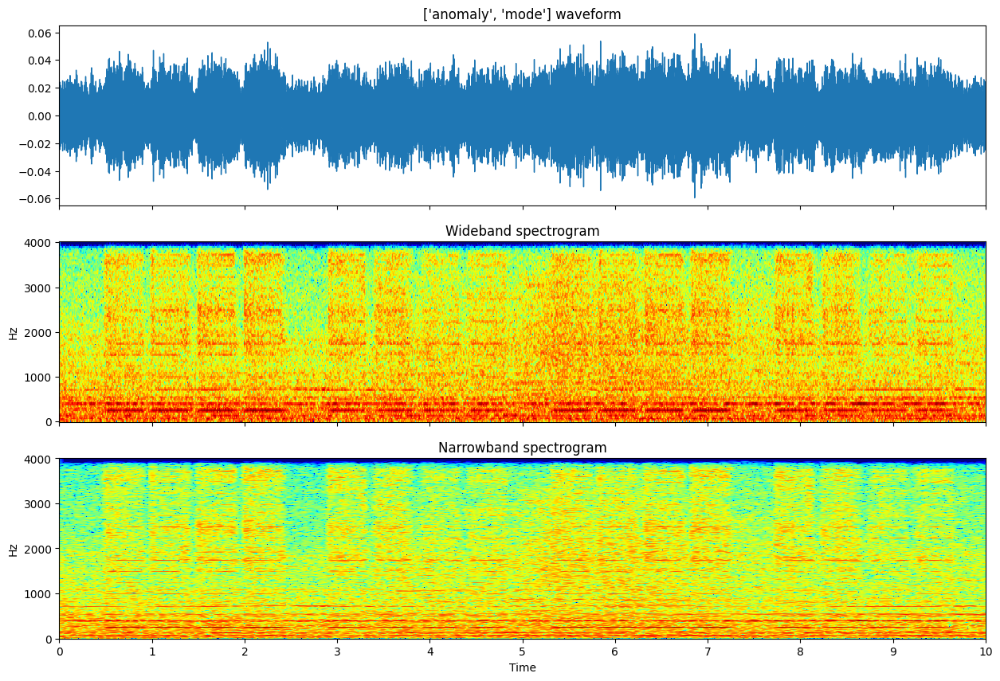

In [32]:
def namestr(obj, namespace):
    return [name for name in namespace if namespace[name] is obj]

mode = anomaly
fig, ax = plt.subplots(nrows=3, sharex=True, figsize=(15, 10))
librosa.display.waveshow(mode, sr=dsr, ax=ax[0], x_axis=None)
ax[0].set_xlim([0, len(mode)/dsr])
ax[0].set(title=f'{namestr(mode, globals())} waveform');

n_fft=256
hop_length=64
S_anomaly = np.abs(librosa.stft(mode, n_fft=n_fft, 
                               hop_length=hop_length))
librosa.display.specshow(
    librosa.amplitude_to_db(S_anomaly, ref=np.max), n_fft=n_fft,
    hop_length=hop_length, sr=dsr, x_axis='time', 
    y_axis='linear', ax=ax[1], cmap='jet')
ax[1].set(title='Wideband spectrogram', xlabel=None);

n_fft=1024
hop_length=64
S_anomaly = np.abs(librosa.stft(mode, n_fft=n_fft, 
                               hop_length=hop_length))
librosa.display.specshow(
    librosa.amplitude_to_db(S_anomaly, ref=np.max), n_fft=n_fft, 
    hop_length=hop_length, sr=dsr, x_axis='time', 
    y_axis='linear', ax=ax[2], cmap='jet')
ax[2].set(title='Narrowband spectrogram');

## MFCCs

In speech and audio processing, it's a common trick to look at the Mel-frequency cepstral coefficients as they extract the most informational parts of an audio signal. We therefore take a look at the range of the 20 coefficients of the all audio files.

In [8]:
sets = ['train/', 'test']
normal_mfccs = []
anomaly_mfccs = []
train = True
for s in sets:
    audioData = [] 
    srate = []

    directory = "../input/dev_data/dev_data/slider/" + s
    for filename in os.listdir(directory):
        f = os.path.join(directory, filename)
        # checking if it is a file
        if os.path.isfile(f):
            data, sampleRate = librosa.load(f)         
            audioData.append(data) 
            srate.append(sampleRate)
    for a, s in zip(audioData, srate):
        mfcc = librosa.feature.mfcc(y=a, sr=s) 
        mfccScaled = np.mean(mfcc.T, axis=0)
        if train:
            normal_mfccs.append(mfccScaled)
        else:
            anomaly_mfccs.append(mfccScaled)
    train = False

[-438.21918     81.42313   -108.42087     41.420166   -78.64853
   18.740946   -47.427574     8.107783   -31.297764    -5.4277062
  -12.025648   -19.986507    -5.9168816  -25.841402     3.3258731
  -28.260622    -1.688536   -22.214415    -7.5667377  -19.141012 ]
[-276.98782    190.72691    -14.760169   106.56839      1.4675149
   72.86514      1.8376021   44.75929      1.1123896   21.373995
   12.672145    11.393701    21.539858    -0.9969802   26.488508
   -0.683614    26.102121     3.2181032   19.913088     8.422649 ]
[-409.2978      86.92459   -110.657684    40.721733   -70.201385
   18.848593   -49.372494     9.396092   -28.397715    -2.488987
  -12.832374   -17.838182    -7.905197   -25.02733      2.1495552
  -30.932217     0.6914466  -25.23352     -6.0405755  -19.739769 ]
[-2.6863937e+02  1.7565381e+02 -1.8835878e+01  1.0436429e+02
 -1.3793975e+01  6.9997581e+01 -6.5788684e+00  4.2036938e+01
  1.8245511e-01  2.3543852e+01  1.5247747e+01  9.7397356e+00
  2.1757187e+01 -1.1059639e+

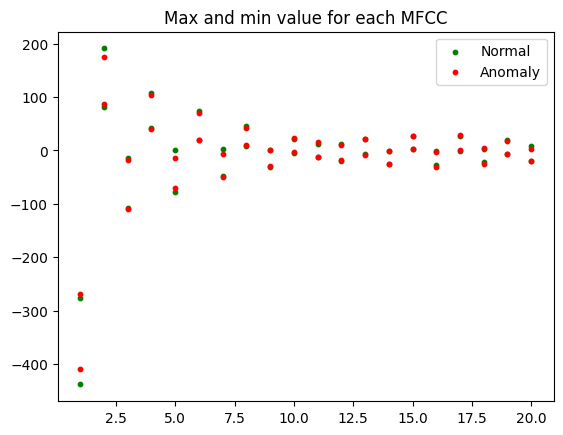

In [15]:
normal_min = np.min(normal_mfccs, 0)
normal_max = np.max(normal_mfccs, 0)
print(normal_min)
print(normal_max)

anomaly_min = np.min(anomaly_mfccs, 0)
anomaly_max = np.max(anomaly_mfccs, 0)

print(anomaly_min)
print(anomaly_max)
x = np.linspace(1,20,20)
plt.scatter(x, normal_min, color = 'g', s=10, label='Normal')
plt.scatter(x, normal_max, color = 'g', s=10)
plt.scatter(x, anomaly_min, color = 'r', s=10, label='Anomaly')
plt.scatter(x, anomaly_max, color = 'r', s=10)
plt.title('Max and min value for each MFCC')
plt.legend()
plt.show()

There is a lot of overlapping for the coefficients, so it will be hard to distinguish the anomalous from normal sounds with this.

## Filtering

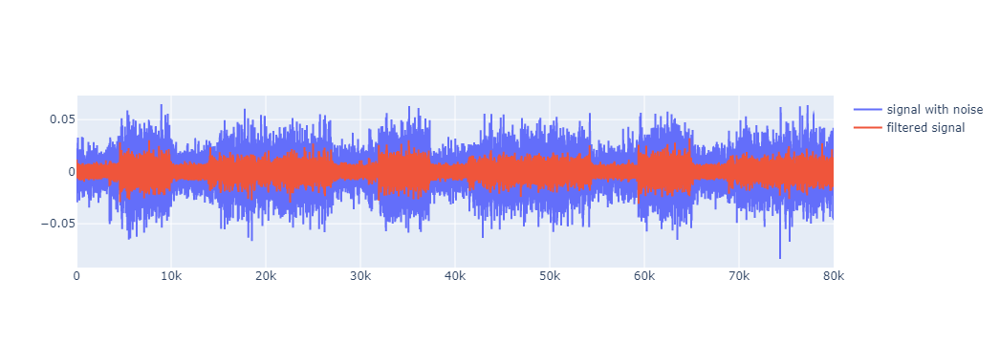

In [54]:
data, sr = librosa.load('../input/dev_data/dev_data/slider/test/anomaly_id_00_00000000.wav', sr=dsr)

import numpy as np
import plotly.graph_objects as go
import plotly.offline as pyo
from scipy.signal import butter,filtfilt,medfilt
# Set notebook mode to work in offline
pyo.init_notebook_mode()

# Filter requirements.
T = 10.0         # Sample Period
fs = sr       # sample rate, Hz
cutoff = 800      # desired cutoff frequency of the filter, Hz ,      slightly higher than actual 1.2 Hz
nyq = 0.5 * fs  # Nyquist Frequency
order = 2       # sin wave can be approx represented as quadratic
n = int(T * fs) # total number of samples

def butter_lowpass_filter(data, cutoff, fs, order):
    normal_cutoff = cutoff / nyq
    # Get the filter coefficients 
    b, a = butter(order, normal_cutoff, btype='high', analog=False)
    y = filtfilt(b, a, data)
    return y

# Filter the data, and plot both the original and filtered signals.
y = butter_lowpass_filter(data, cutoff, fs, order)
#y = medfilt(data,11)
fig = go.Figure()
fig.add_trace(go.Scatter(
            y = data,
            line =  dict(shape =  'spline' ),
            name = 'signal with noise'
            ))
fig.add_trace(go.Scatter(
            y = y,
            line =  dict(shape =  'spline' ),
            name = 'filtered signal'
            ))
fig.show()


IPython.display.Audio(data=y, rate=dsr)

The filtering doesn't help with the distinguisability.

## Simple FFT analysis

Finding the most prominent frequency components and checking if these frequencies are different for normal and anomalous audios.

In [62]:
def fft_plot(audio, sr):
    n = len(audio)
    T = 1/sr
    yf = np.fft.fft(audio)
    yf_plot = 2.0/n * np.abs(yf[:n//2])
    xf = np.linspace(0, 1/(2*T), n//2)
    fig, ax = plt.subplots()
    ax.plot(xf, yf_plot)
    plt.grid()
    plt.xlabel('Frequency')
    plt.ylabel('Magnitude')
    return plt.show()           

def fft_maxes(audio, sr):
    n = len(audio)
    T = 1/sr
    yf = np.fft.fft(audio)
    yf_plot = 2.0/n * np.abs(yf[:n//2])
    xf = np.linspace(0, 1/(2*T), n//2)
    return np.max(yf_plot), xf[np.argmax(yf_plot)]


In [63]:
sets = ['train/', 'test']
normal_max_magnitude = []
normal_strongest_freq = []
anomaly_max_magnitude = []
anomaly_strongest_freq = []
train = True
for s in sets:
    audioData = [] 
    srate = []

    directory = "../input/dev_data/dev_data/slider/" + s
    for filename in os.listdir(directory):
        f = os.path.join(directory, filename)
        # checking if it is a file
        if os.path.isfile(f):
            data, sampleRate = librosa.load(f)         
            audioData.append(data) 
            srate.append(sampleRate)
    for a, s in zip(audioData, srate):
        magn, max_freq = fft_maxes(a, s)
        if train:
            normal_max_magnitude.append(magn)
            normal_strongest_freq.append(max_freq)
        else:
            anomaly_max_magnitude.append(magn)
            anomaly_strongest_freq.append(max_freq)
    train = False
    


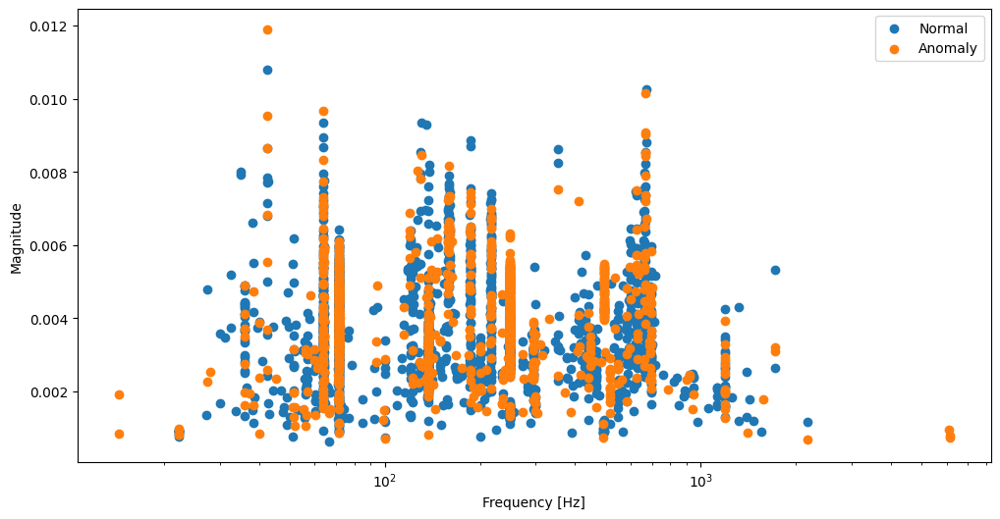

In [87]:
x_normal = np.linspace(0, np.max(normal_strongest_freq), len(normal_strongest_freq))
x_anomaly = np.linspace(0, np.max(anomaly_strongest_freq), len(anomaly_strongest_freq))

plt.figure(figsize = (12, 6))
plt.scatter(normal_strongest_freq, normal_max_magnitude, label='Normal')
plt.scatter(anomaly_strongest_freq, anomaly_max_magnitude, label='Anomaly')
plt.xscale('log')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Magnitude')
plt.legend()
plt.show()

Can't really see any clear groupings for normal and anomalous, so this isn't helpful for distinguishing either.

## Find an average and try to find a threshold for deviation

Since it's visible in the audio waveform that there is anomalies in the anomalous sounds, maybe it can be helpful to compare the mean of the signal to it's maximum value. Therefore we find exactly this and plot it's deviation factor. The hypothesis here is that the anomalous sounds will deviate more from it's mean than the normal ones.

In [70]:
def mean_dev(audio,sr):
    mean_val = np.mean(np.abs(audio))
    signal_max = np.max(audio)
    deviation = signal_max/mean_val
    return mean_val, deviation

(0.00980155, 5.501424)

In [73]:
sets = ['train/', 'test']
normal_means = []
normal_devs = []
anomaly_means = []
anomaly_devs = []
train = True
for s in sets:
    audioData = [] 
    srate = []

    directory = "../input/dev_data/dev_data/slider/" + s
    for filename in os.listdir(directory):
        f = os.path.join(directory, filename)
        # checking if it is a file
        if os.path.isfile(f):
            data, sampleRate = librosa.load(f)         
            audioData.append(data) 
            srate.append(sampleRate)
    for a, s in zip(audioData, srate):
        mean_val, deviation = mean_dev(a, s)
        if train:
            normal_means.append(mean_val)
            normal_devs.append(deviation)
        else:
            anomaly_means.append(mean_val)
            anomaly_devs.append(deviation)
    train = False

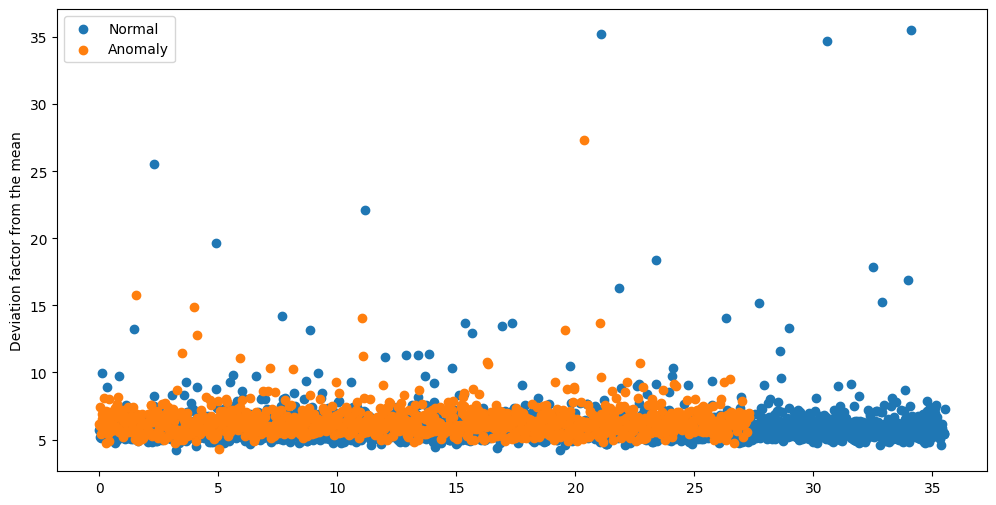

In [79]:
x_normal = np.linspace(0, np.max(normal_devs), len(normal_devs))
x_anomaly = np.linspace(0, np.max(anomaly_devs), len(anomaly_devs))

plt.figure(figsize = (12, 6))
plt.scatter(x_normal, normal_devs, label='Normal')
plt.scatter(x_anomaly, anomaly_devs, label='Anomaly')
plt.legend()
plt.ylabel('Deviation factor from the mean')
plt.show()

Again it doesn't look like we get any useful data that helps us distinguish the the 2 classes. Our idea about the deviation being higher for the anomalous sounds was not valid according to the plot above.